In [ ]:
"this notebook goes through the process of collecting data and etc "

In [54]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats
import seaborn as sns
from dataClasses import Trial,Neuron
from sklearn.feature_selection import RFECV
from sklearn import svm
from sklearn.model_selection import cross_validate, GridSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix,classification_report
import warnings
import random
import math


# Import Libraries
import torch
import torch.nn as nn
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

In [2]:
# bring in neuron data - this uses previously created files.  you need to chooes which file to use (one for each brain area)

all_neurons=np.load("processed_data/PPC_all_neurons.npy",allow_pickle=True)


In [3]:
#choose which random method to use as follows:
#0: normalize the PCA features and then randomly select according to normal distribution
#1: non-parametric. select a random  
random_method=1
# number of PCA features to use
num_features=8

# number fo nearest neighbours to use in PAIRS analysis
n_neighbours=3# this is the samllest value for which random median>=pi/8

In [4]:
data=np.empty((len(all_neurons), 41*6))
for i in range(all_neurons.shape[0]):
    all_means_single_neuron=np.concatenate((all_neurons[i].mean_time_series[0],all_neurons[i].mean_time_series[1],all_neurons[i].mean_time_series[2],all_neurons[i].mean_time_series[3],all_neurons[i].mean_time_series[4],all_neurons[i].mean_time_series[5]),axis=0)
    data[i,:]=all_means_single_neuron
#carry out PCA
pca = PCA(n_components=num_features,whiten=False)  
pca.fit(data)


PCA(n_components=8)

In [5]:
## print out explained variance
print("n components ",pca.n_components_)
print("Variance sum of % ",np.sum(pca.explained_variance_ratio_))
data_transformed = pca.transform(data) 
print("shape of data after PCA", data_transformed.shape)


n components  8
Variance sum of %  0.9864672900068028
shape of data after PCA (129, 8)


In [ ]:
##### if not using the whole set, then filter by mouse id and experiment date.
#my_mouse_id=1268
#my_date=20190814
#i=0
#my_mask=np.zeros((all_neurons.shape),dtype=bool)
#for neuron in all_neurons:
#    if neuron.mouse_id==my_mouse_id and neuron.date==my_date:
#        my_mask[i]=True
#    else:
#        my_mask[i]=False 
#    i=i+1
#data_transformed=data_transformed[my_mask]      
#print("shape of data after reducing to required experiment", data_transformed.shape)
################


In [6]:


num_neurons=data_transformed.shape[0]
num_features=data_transformed.shape[1]

if random_method==0:
    #normalize the features
    scaler = StandardScaler()    
    scaler.fit(data_transformed)
    data_transformed=scaler.transform(data_transformed)


In [7]:
'''
produce N*N matrix showing the angles between each of the neurons, where N is numbe rof neurons
'''
numerator=np.dot(data_transformed,data_transformed.T)
size=np.sqrt(np.diag(numerator)).reshape(-1,1)
denominator=np.dot(size,size.T)
data_angles_cosine=numerator/denominator # this is a symmetrix matrix showing the angles between each neuron
# there seems to be a rounding error. if>1 make cosine=1
data_angles_cosine=np.where(data_angles_cosine>1,1,data_angles_cosine)
# what comes up as eg +5degrees might be -5 degrees,but doesnt matter - no need to correct for that
data_angles=np.arccos(data_angles_cosine)

In [8]:
'''
for each neuron find the difference angle to the 3 nearest angles of the other 288 neurons
and take the average of these three
'''
# we now have a histogram of what the average angle is between a neuron and its nearest neighbours
print("n_neighbours",n_neighbours)
mean_angles=np.empty(data_angles.shape[0])
# each i (row) of data_angles is for one neuron, the 289 angles to all the other neurons.  call the is nueron_distances
# for a chosen i, distances is then 289*4 = the 4 nearest neighbour angles for each of the neurons
#  mean_angle is the mean of the first row of distances ie the mean distance from that neuron to its nearest neighbours
for i in range(data_angles.shape[0]):
    neuron_distances=data_angles[i,:]
    distances=np.sort(neuron_distances)[1:n_neighbours+1]
    mean_angle=np.mean(distances)
    mean_angles[i]=mean_angle
actual_mean_angles=mean_angles.copy()
actual_data_transformed=data_transformed.copy()   



n_neighbours 3


In [9]:
'''
for compaison with the real data:
create random distributions of nearest neighbours
for 10k different runs, generate 289 neurons according to gaussian distn with mean and stdev of the actual data
average over thos 10k runs will be histogram of the nearest neighbour distribution if the distribution was random
i.e this is how clustering would likely be if there was no clustering
'''

# work out mean and stdevs of the features
# so the the gaussina distibution estimate of each of the PCs in the real data
means=np.mean(data_transformed,axis=0)
stdevs=np.std(data_transformed,axis=0)  

## generate 10k data sets of 289 random vectors
# each row is a simulation of 289 neurons, each of which is descirbed by the number of PCs used in the real data.
all_mean_angles=[]
num_runs=10000
for run in range(num_runs):
    if run%100==0:
        print("run ", run, " of ",num_runs )
    data_transformed=np.empty((num_neurons,num_features))
    #generate random data
    if random_method==0:
        ### assume each PCA is a normal distribution and generate according to that 
        # for this appoach to be valid needs the PCA to be normalized
        for i in range(num_features):        
            data_transformed[:,i]=means[i]+ stdevs[i]*np.random.randn(num_neurons)
    elif random_method==1:
        for i in range(num_features): 
            data_transformed[:,i]=np.random.choice(actual_data_transformed[:,i], data_transformed.shape[0])    
    '''
    produce 289*289 matrix showing the angles between each of the neurons
    '''
    numerator=np.dot(data_transformed,data_transformed.T)
    size=np.sqrt(np.diag(numerator)).reshape(-1,1)
    denominator=np.dot(size,size.T)
    data_angles_cosine=numerator/denominator # this is a symmetrix matrix showing the angles between each neuron
    # there seems to be a rounding error. if>1 make cosine=1
    data_angles_cosine=np.where(data_angles_cosine>1,1,data_angles_cosine)
    # convert cosineinto angle
    # what comes up as eg +5degrees might be -5 degrees,but doesnt matter - no need to correct for that
    data_angles=np.arccos(data_angles_cosine)
    #temp=data_angles*180/np.pi # produce 0 to 180 degrees
    '''
    for each neuron find the difference angle to the 3 nearest angles of the other 288 neurons
    and take the average of these three
    '''
    # we now have a histogram of what the average angle is between a neuron and its nearest neighbours
    mean_angles=np.empty(data_angles.shape[0])
    # each i (row) of data_angles is for one neuron, the 289 angles to all the other neurons.  call the is nueron_distances
    # for a chosen i, distances is then 289*4 = the 4 nearest neighbour angles for each of the neurons
    #  mean_angle is the mean of the first row of distances ie the mean distance from that neuron to its nearest neighbours
    for i in range(data_angles.shape[0]):
        neuron_distances=data_angles[i,:]
        distances=np.sort(neuron_distances)[1:n_neighbours+1]
        mean_angle=np.mean(distances)
        mean_angles[i]=mean_angle
    all_mean_angles.append(mean_angles)
dummy_mean_angles_shaped=np.asarray(all_mean_angles)
dummy_mean_angles=dummy_mean_angles_shaped.ravel()


run  0  of  10000
run  100  of  10000
run  200  of  10000
run  300  of  10000
run  400  of  10000
run  500  of  10000
run  600  of  10000
run  700  of  10000
run  800  of  10000
run  900  of  10000
run  1000  of  10000
run  1100  of  10000
run  1200  of  10000
run  1300  of  10000
run  1400  of  10000
run  1500  of  10000
run  1600  of  10000
run  1700  of  10000
run  1800  of  10000
run  1900  of  10000
run  2000  of  10000
run  2100  of  10000
run  2200  of  10000
run  2300  of  10000
run  2400  of  10000
run  2500  of  10000
run  2600  of  10000
run  2700  of  10000
run  2800  of  10000
run  2900  of  10000
run  3000  of  10000
run  3100  of  10000
run  3200  of  10000
run  3300  of  10000
run  3400  of  10000
run  3500  of  10000
run  3600  of  10000
run  3700  of  10000
run  3800  of  10000
run  3900  of  10000
run  4000  of  10000
run  4100  of  10000
run  4200  of  10000
run  4300  of  10000
run  4400  of  10000
run  4500  of  10000
run  4600  of  10000
run  4700  of  10000
run 

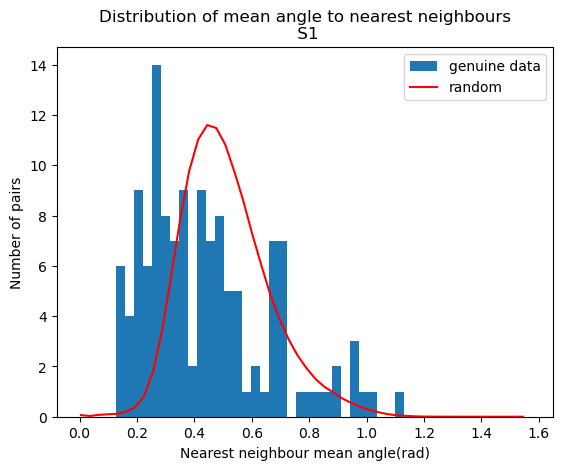

In [10]:

plt.figure()
step=0.01
bins=np.pi*np.arange(0,0.5+step,step)
actual_hist=plt.hist(actual_mean_angles,bins=bins,label="genuine data") # actual data
step1=0.01
bins=np.pi*np.arange(0,0.5+step1,step1)
dummy_hist=np.histogram(dummy_mean_angles,bins=bins)# actual data
plt.plot(dummy_hist[1][:-1]+step1/2, dummy_hist[0]/num_runs*step/step1,"r", label="random")
plt.title("Distribution of mean angle to nearest neighbours\n S1")
plt.xlabel("Nearest neighbour mean angle(rad)")
plt.ylabel("Number of pairs")    
plt.legend()
plt.plot()
plt.show()  


c:\Users\isabe\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\isabe\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


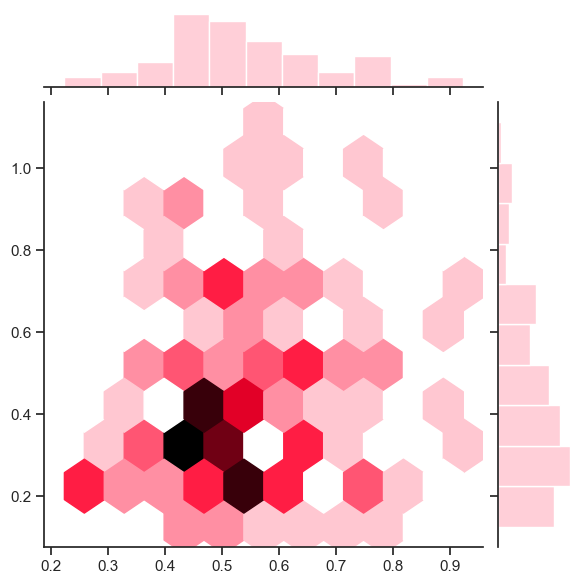

In [20]:
#same plot in a different style
sns.set_theme(style="ticks")
x=dummy_mean_angles
y=actual_mean_angles

sns.jointplot(x=x[0:len(y)], y=y, kind="hex", color='pink')


median real data 0.4068485049802794
median random 0.5029858419318674


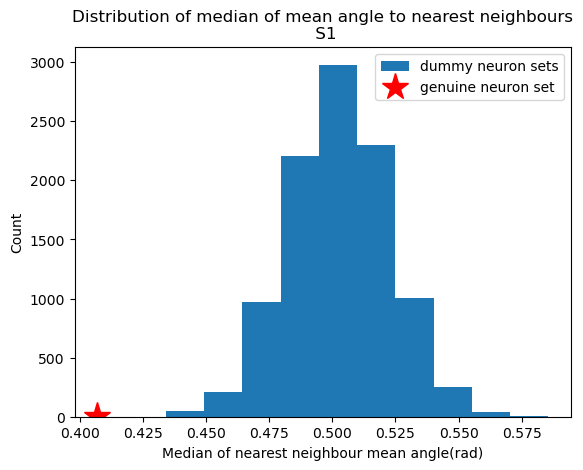

In [11]:
'''
now compare median of actual data with median distribution of all the dummy runs
'''
print("median real data", np.median(actual_mean_angles)) 
print("median random", np.median(dummy_mean_angles))
all_dummy_medians=np.median(dummy_mean_angles_shaped,axis=1)
plt.figure()
medians_hist=plt.hist(all_dummy_medians, label="dummy neuron sets")
plt.plot(np.median(actual_mean_angles),5,"r*",markersize=20,label="genuine neuron set")
plt.title("Distribution of median of mean angle to nearest neighbours\n S1")
plt.xlabel("Median of nearest neighbour mean angle(rad)")
plt.ylabel("Count")
plt.legend()
plt.show()

In [12]:
''' work out where the real data sits in the list of 10,000 dummy runs 
(so p<.05 requires it to be less than 500)
'''
print("pseudo pvalue=", stats.percentileofscore(all_dummy_medians,np.median(actual_mean_angles)))


pseudo pvalue= 0.0


Now analyse how well the dff data of each neuron can predict GO/NOGO or LICK/NOLICK status of trials.  
Performance is compared against 100 surrogates generated by shuffling trial labels. 
Neurons were deemed to support classification at a significant level of performance if they performed better than 95 of the surrogates.
Before running this script, the required values for brain_area (S1, S1naive or PPC) and type_of_analysis (GO or LICK) should be set in the code.  
Since this script takes a longtime to run, output files are created, allowing analysis to be run separately without having to rerun these SVMs each time.


In [23]:
############ SELECT VALUES HERE
brain_area="S1"  ### choices are "S1" "S1naive" or "PPC"
type_of_analysis= "GO" ### choices are "GO" or "LICK"
#########################


In [27]:

all_trials=np.load("processed_data/"+brain_area + "_all_trials.npy",allow_pickle=True)
trial_list=np.empty((all_trials.shape[0],3))
trial_dff=np.empty((all_trials.shape[0],41)) 
trial_licks=np.empty((all_trials.shape[0],41))

for trial in range(all_trials.shape[0]):
    
    trial_list[trial,0]=all_trials[trial].neuron_num

    
    if type_of_analysis=="GO":
        # for labelling go nogo
        if (all_trials[trial].trial_type)=="go":
            trial_list[trial,1]=1
        elif (all_trials[trial].trial_type)=="nogo":
            trial_list[trial,1]=0
        else:
            print("gone wrong on neuron ",all_trials[trial].neuron_num )
    elif type_of_analysis=="LICK":    
        #for labelling lick nolick
        if (all_trials[trial].trial_outcome)=="FA":
            trial_list[trial,1]=1
        elif (all_trials[trial].trial_outcome)=="Hit":
            trial_list[trial,1]=1
        elif (all_trials[trial].trial_outcome)=="Miss":
            trial_list[trial,1]=0
        elif (all_trials[trial].trial_outcome)=="CR":
            trial_list[trial,1]=0
        else:
            print("gone wrong on neuron ",all_trials[trial].neuron_num )
    else:
        print("Type of analysis can only be 'GO' or 'LICK'")
    
    trial_list[trial,2]=all_trials[trial].mouse_id
    if (all_trials[trial].trial_outcome)=="FA" or (all_trials[trial].trial_outcome)=="Hit":
        trial_dff[trial,0:41]=all_trials[trial].dff 
        #rebase  dff 
        trial_licks[trial,:]=all_trials[trial].licks
        lick_start=np.argmax(trial_licks[trial,:]==1,axis=0)
        trial_dff_rel_licks=np.zeros(trial_licks.shape[1])
        new_start=lick_start-4
        if new_start>=0:                    
            # move the array of licks left so that timeseries starst at lick time
            trial_dff_rel_licks[0:trial_licks.shape[1]-new_start]=all_trials[trial].dff[new_start: ]
            ## need to mske the last few timesteps on the new series = final timestep on original series
            trial_dff_rel_licks[trial_licks.shape[1]-new_start :]=all_trials[trial].dff[-1]
        else: 
            # move the array of licks right so that timeseries starst at lick time
            trial_dff_rel_licks[0-new_start :]=all_trials[trial].dff[0:all_trials[trial].dff.shape[0]+new_start]
            ## need to mske the first few timesteps on the new series = first timestep on original series
            trial_dff_rel_licks[0:-new_start]=all_trials[trial].dff[ 0 ]
            #trial_dff[trial,41:82]=trial_dff_rel_licks
    else:
        trial_dff[trial,0:41]=all_trials[trial].dff 
        #trial_dff[trial,41:82]=all_trials[trial].dff

In [29]:
print("Array of neuron_num and trial type",trial_list.shape)
print("Array of dff",trial_dff.shape)
neuron_list=np.unique(trial_list[:,0]).reshape(-1,1)
print("Num of neurons before filter=",neuron_list.shape[0])

Array of neuron_num and trial type (116375, 3)
Array of dff (116375, 41)
Num of neurons before filter= 289


In [ ]:
'''
Now it is time to start doing some classification on the data 
'''
accuracies=[]
dummy_distn=[]
mouse_ids=[]
Cs=[]
ranks=[]
experiments=[]
count=0



for neuron in neuron_list:
    print("\n",count, str(neuron_list[count,0]), "XXXXXXXXXXXXXXXXXXXX")
    # filter down to just that neuron
    neuron_data_list= trial_list[trial_list[:,0]==neuron].copy()
    neuron_data_dff= trial_dff[trial_list[:,0]==neuron].copy()
    X=neuron_data_dff.copy()
    y=neuron_data_list[:,1]
    ratio_size=.25

    if (y == 0).sum()/y.shape[0]>=ratio_size and (y == 1).sum()/y.shape[0]>=ratio_size:
        _=0
        # print("No cut down needed")
    else:
        print("You need to oversample here")
    ####  don;t create SVM if less than a certain % of the trials are in one of the categories OR if less than certain number of total trials
    #### eg if set to .15 then the split must be at least 15%/85%. 14/86 or 86/14 would fail
    if (y == 0).sum()/y.shape[0]>=ratio_size and (y == 1).sum()/y.shape[0]>=ratio_size and y.shape[0]>100:
        kfold_size=min(5,(y == 0).sum(),(y == 1).sum())
        print("Included. Number in each category: No go (or lick)",(y == 0).sum(),"Yes go (or lick)", (y == 1).sum())#, ". kfold size", kfold_size)
        # do pca on the time series
        whitening=False
        pca = PCA(whiten=whitening)#, n_components=25)  
        pca.fit(X)
        X_transformed = pca.transform(X)
        
        ### normalize
        scaler = StandardScaler()    
        scaler.fit(X_transformed)
        X_transformed=scaler.transform(X_transformed)

        
        ## print out explained variance
        print("n components: ",pca.n_components_)
        print("Variance sum of:",np.sum(pca.explained_variance_ratio_))
    
        my_class_weight="balanced"
        
        '''
        instead of RFECV, just do a CV test on data with PCA set to no reduction
        '''
        highest_score=0
        optimalC=0
        for C in [.001, 0.01,.1, 1]:
                        svc = svm.SVC(cache_size=1000, class_weight=my_class_weight,kernel="linear", C=C)
                        cv_results = cross_validate(svc, X_transformed, y, cv=StratifiedKFold(kfold_size),scoring='accuracy')
                        #cv_results = cross_validate(svc, X_transformed, y, cv=kfold_size,scoring='accuracy')
                        mean_CV=np.mean(cv_results['test_score'])
                        print(C, "check the score - CV test score", mean_CV)
                        if mean_CV>highest_score:
                            highest_score=mean_CV
                            optimalC=C
        real_highest_score=highest_score.copy()
        print("Best ", optimalC, highest_score)
        accuracies.append(highest_score)
        Cs.append(optimalC)
        mouse_ids.append(str(neuron_list[count,0])[:4])
        experiments.append(str(neuron_list[count,0]))
        count+=1

        '''
        then do 100 shuffles of the label anc see how well can create classifier.
        this gives a distibution which we can compare to the best classifer using actual data
        '''
        y_new=y.copy()       
        dummy_accuracies=[]
        for my_dummy in range(100):
            random.seed()
            random.shuffle(y_new)
            highest_score=0
            optimalC=0
            for C in [.001, 0.01,.1, 1]:
                        svc = svm.SVC(cache_size=1000, class_weight=my_class_weight,kernel="linear", C=C)
                        cv_results = cross_validate(svc, X_transformed, y_new, cv=StratifiedKFold(kfold_size),scoring='accuracy')
                        #cv_results = cross_validate(svc, X_transformed, y, cv=kfold_size,scoring='accuracy')
                        mean_CV=np.mean(cv_results['test_score'])
                        if mean_CV>highest_score:
                            highest_score=mean_CV
                            optimalC=C
            dummy_accuracies.append(highest_score)
            
        my_rank=stats.percentileofscore(dummy_accuracies, real_highest_score)
        print("Rank ", my_rank)
        
        # plt histogram of shuffled label perofrmancs versus red dot of real label
        plt.figure()
        bins=np.arange(.3   ,1,.025)
        plt.hist(dummy_accuracies,bins=bins,label="shuffled labels")
        plt.plot(real_highest_score,1,"X",markersize=20,label="with genuine label")
        plt.title("Distribution of classifier performance")
        plt.xlabel("Classifier performance")
        plt.ylabel("Count across 100 shuffles")
        rank_text="Rank="+str(int(my_rank))
        plt.text(0.3,2,rank_text)
        plt.legend()
        plt.show()
        
        
        dummy_distn.append(dummy_accuracies)
        ranks.append(my_rank)
    else:
        accuracies.append(-100)
        ranks.append(-100)
        print("Excluded. Number in each category: No go (or lick)",(y == 0).sum(),"Yes go (or lick)", (y == 1).sum())
        count+=1



In [93]:
class RNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim):
        super(RNNModel, self).__init__()
        
        # Defining the RNN layer
        self.rnn = nn.RNN(input_dim, hidden_dim, layer_dim, batch_first=True)
        
        # Fully connected layer
        self.fc = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        # x: (batch_size, seq_len, input_size)
        
        # RNN forward pass
        out, _ = self.rnn(x)
        
        # Use only the last time step's output
        out = out[:, -1]  # Take the output from the last sequence step
        
        # Fully connected layer
        out = self.fc(out)
        
        return out


In [116]:
for neuron in neuron_list:
    print("\n", neuron, "XXXXXXXXXXXXXXXXXXXX")
    
    neuron_data_list = trial_list[trial_list[:, 0] == neuron].copy()
    neuron_data_dff = trial_dff[trial_list[:, 0] == neuron].copy()
    
    X = neuron_data_dff.copy()
    y = neuron_data_list[:, 1]
    #trying the dims
    X = X.reshape(X.shape[0],X.shape[1],1)
    #### Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Convert to tensors
    Xtrain = torch.from_numpy(X_train).float()
    ytrain = torch.from_numpy(y_train).long()  # Assuming classification
    Xtest = torch.from_numpy(X_test).float()
    ytest = torch.from_numpy(y_test).long()

    # Batch size, epochs, and iterations
    batch_size = 10
    n_iters = 10000
    num_epochs = n_iters // (len(X_train) // batch_size)
    num_epochs = int(num_epochs)

    # Pytorch train and test sets
    train = TensorDataset(Xtrain, ytrain)
    test = TensorDataset(Xtest, ytest)

    # Data loaders
    train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test, batch_size=batch_size, shuffle=False)

    # Create the RNN model
    input_dim = X.shape[-1]
    hidden_dim = 10
    layer_dim = 1
    output_dim = 1

    model = RNNModel(input_dim, hidden_dim, layer_dim, output_dim)

    # Loss function and optimizer
    error = nn.BCEWithLogitsLoss()
    learning_rate = 0.05
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

    loss_list = []
    iteration_list = []
    accuracy_list = []
    count = 0
    

    for epoch in range(num_epochs):
        total=0
        correct=0
        for i, (X_batch, y_batch) in enumerate(train_loader):

            print(f"X_batch shape: {X_batch.shape}")
            print(f"y_batch shape: {y_batch.shape}")
            # Clear gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(X_batch)
            outputs=outputs.squeeze()
           
            # Apply sigmoid to get probabilities
            probabilities = torch.sigmoid(outputs)

            # Convert probabilities to binary class predictions using a threshold (0.5)
            predicted = (probabilities > 0.5).long()

            # Count total number of samples in the batch
            total += y_batch.size(0)
            print("total",total)
            # Count correct predictions
            correct += (predicted.squeeze() == y_batch).sum().item()
                 # Calculate accuracy
            accuracy = 100 * correct / total
            print(f"Train Accuracy: {accuracy:.2f}%")
           
            y_batch=y_batch.float()
            loss = error(outputs, y_batch)

            # Backward pass and optimization
            loss.backward()
            optimizer.step()


        correct = 0
        total = 0
        for X_test_batch, y_test_batch in test_loader:
            outputs = model(X_test_batch)
            
            predicted = torch.max(outputs.data, 1)[1]
            total += y_test_batch.size(0)
            correct += (predicted == y_test_batch).sum().item()

        accuracy = 100 * correct / float(total)
        print(f"Test Accuracy: {accuracy:.2f}%")

        # Store loss and accuracy
        loss_list.append(loss.item())
        iteration_list.append(count)
        accuracy_list.append(accuracy)
'''
                if count % 500 == 0:
                    print('Iteration: {}  Loss: {}  Accuracy: {} %'.format(count, loss.item(), accuracy))

                    # Visualization
                    plt.plot(iteration_list, loss_list)
                    plt.xlabel("Number of iterations")
                    plt.ylabel("Loss")
                    plt.title("RNN: Loss vs Number of iterations")
                    plt.show()

                    plt.plot(iteration_list, accuracy_list, color="red")
                    plt.xlabel("Number of iterations")
                    plt.ylabel("Accuracy")
                    plt.title("RNN: Accuracy vs Number of iterations")
                    plt.savefig('graph.png')
                    plt.show()
''' 


 [3.01201803e+11] XXXXXXXXXXXXXXXXXXXX
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 10
Train Accuracy: 40.00%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 20
Train Accuracy: 55.00%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 30
Train Accuracy: 53.33%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 40
Train Accuracy: 52.50%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 50
Train Accuracy: 54.00%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 60
Train Accuracy: 58.33%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 70
Train Accuracy: 54.29%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 80
Train Accuracy: 53.75%
X_batch shape: torch.Size([10, 41, 1])
y_batch shape: torch.Size([10])
total 90
Train Accuracy: 54.44%
X_batch shape: torch.Size([10, 41

In [ ]:
## Consider other sampling method here. This cell is the OG way. Maybe way is with ADYSIN 


def cutback(X,y,ratio_size):
## used to randomly delete some data points and labels in order to make the ratio a certain size
## Y LABELS MUST BE IN THE FORM 0 AND 1
    if (y == 0).sum()/y.shape[0]<ratio_size: 
    # need to delete some label 1
        num_to_delete=(y == 1).sum()-(y == 0).sum()*((1/ratio_size)-1)
        num_to_delete=int(math.ceil(num_to_delete))
        print("cutting back",(y == 0).sum(),(y == 1).sum()," to ",(y == 0).sum(),(y == 1).sum()-num_to_delete)
        for i in range(num_to_delete):
            rate=np.sum(y)
            cumrate=np.cumsum(y)
            my_rand=np.random.rand()*rate
            event = np.where(cumrate>my_rand)[0][0]
            y=np.delete(y,event,axis=0)
            X=np.delete(X,event,axis=0)
    elif (y == 1).sum()/y.shape[0]<ratio_size:
    # need to delete some label 0
        y=np.where(y==1,2,y)
        y=np.where(y==0,1,y)
        y=np.where(y==2,0,y)
        num_to_delete=(y == 1).sum()-(y == 0).sum()*((1/ratio_size)-1)
        num_to_delete=int(math.ceil(num_to_delete))
        print("cutting back",(y == 0).sum(),(y == 1).sum()," to ",(y == 0).sum(),(y == 1).sum()-num_to_delete)
        for i in range(num_to_delete):
            rate=np.sum(y)
            cumrate=np.cumsum(y)
            my_rand=np.random.rand()*rate
            event = np.where(cumrate>my_rand)[0][0]
            y=np.delete(y,event,axis=0)
            X=np.delete(X,event,axis=0)
        np.where(y==0,2,y)
        np.where(y==1,0,y)
        np.where(y==2,1,y)
    else:
        print("Something wrong - no reason to have called the cutback function")
    return X,y    


In [ ]:
from collections import Counter 
from sklearn.datasets import make_classification 
from imblearn.over_sampling import ADASYN 
